**Assignment 2: Image Representations**

*CPSC 480/580: Computer Vision*

*Yale University*

*Instructor: Alex Wong*


**Prerequisites**:

1. Enable Google Colaboratory as an app on your Google Drive account

2. Create a new Google Colab notebook, this will also create a "Colab Notebooks" directory under "MyDrive" i.e.
```
/content/drive/MyDrive/Colab Notebooks
```

3. Create the following directory structure in your Google Drive
```
/content/drive/MyDrive/Colab Notebooks/CPSC 480-580: Computer Vision/Assignments
```

4. Move the 02_assignment.ipynb into
```
/content/drive/MyDrive/Colab Notebooks/CPSC 480-580: Computer Vision/Assignments
```
so that its absolute path is
```
/content/drive/MyDrive/Colab Notebooks/CPSC 480-580: Computer Vision/Assignments/02_assignment.ipynb
```

In this assignment, we will implement scale space image representation, multi-scale Gaussian pyramid, and Laplacian pyramid. We will also experiment with an off-the-shelf blob detector from skimage.  

**Submission**:

1. Implement all TODOs in the code blocks below.

2. Run the Colab Notebook to produce results for each code block.

3. Answer the following questions:

```
3a. What will happen to all images when we continue to increase sigma to some very large value?

Fill in your answer here.
```

```
3b. Why are the differences between Gaussian Pyramid and Scale Space representations?

Fill in your answer here.
```

```
3c. What is the key advantage in Gaussian Pyramid over Scale Space representation? Why is this advantage possible?

Fill in your answer here.
```

4. List any collaborators.

```
Collaborators: Doe, Jane (Please write names in <Last Name, First Name> format)

Collaboration details: Discussed ... implementation details with Jane Doe.
```

Import packages

In [ ]:
import skimage.feature
import skimage.filters
import skimage.transform
from scipy.signal import convolve2d
import numpy as np
import matplotlib.pyplot as plt

Utility functions for plotting

In [ ]:
def config_plot():
    '''
    Function to remove axis tickers and box around figure
    '''

    plt.box(False)
    plt.axis('off')

Loading data

In [ ]:
# Load coffee image from skimage
image_coffee = skimage.data.coffee()

# Load coins image from skimage
image_coin = skimage.data.coins()

images = [image_coffee, image_coin]
images_gray = [None] * len(images)

# Create gray (if images aren't already) images
for idx, image in enumerate(images):

    # Convert images to gray if it isn't already
    if len(image.shape) > 2 and image.shape[-1] > 1:
        image_gray = skimage.color.rgb2gray(image)
    else:
        image_gray = image

    images_gray[idx] = image_gray

Scale space representation

In [ ]:
def gaussian_kernel(sigma=1.0):
    '''
    Generates a 2D Gaussian kernel

    Arg(s):
        sigma : float
            The standard deviation of the Gaussian

    Returns:
        np.ndarray: A 2D Gaussian kernel normalized to sum to 1
    '''
    # Kernel size heuristic: cover +/-3 sigma, ensure odd size
    k = int(np.ceil(6 * max(0.1, float(sigma)))) | 1  # make odd, avoid zero
    r = (k - 1) // 2
    y, x = np.mgrid[-r:r+1, -r:r+1]
    g = np.exp(-(x**2 + y**2) / (2.0 * sigma**2))
    g /= g.sum()
    return g


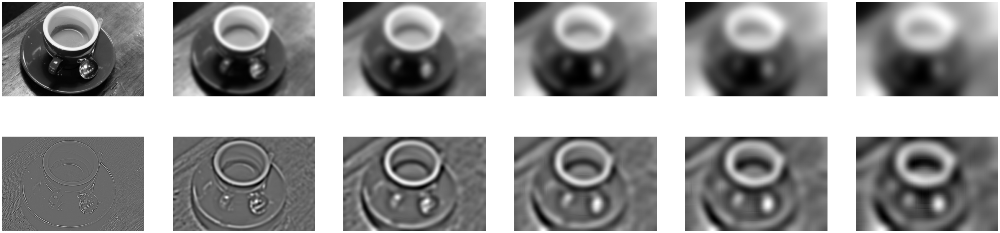

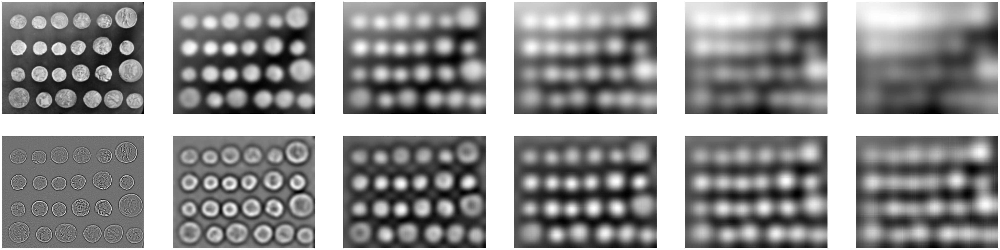

In [ ]:
# Implement scale space representation for the set of input images
for image_gray in images_gray:

    # TODO: Create Gaussian scale space of 6 levels for sigmas evenly space up to 25
    # You may use convolve2d
    sigmas = np.linspace(1, 25, 6)
    img = image_gray.astype(np.float32)
    if img.max() > 1.5:
        img = img / 255.0

    gaussians = []
    for s in sigmas:
        kernel = gaussian_kernel(s)
        kh, kw = kernel.shape
        py, px = (kh - 1) // 2, (kw - 1) // 2
        img_pad = np.pad(img, ((py, py), (px, px)), mode='reflect')
        g = convolve2d(img_pad, kernel, mode='valid')
        gaussians.append(g)

    # TODO: Compute Laplacian with kernel size of 3 over the Gaussian scale space
    # You may use skimage.filters.laplace
    laplacians = [skimage.filters.laplace(g, ksize=3) for g in gaussians]

    # TODO: Compute normalized Laplacian of Gaussians
    nlogs = [(s**2) * l for s, l in zip(sigmas, laplacians)]

    # TODO: 2 by 6 figure with (72, 18) figure size and plot each gray image with 'gray' colormap
    # Show scale space image in row 1 and normalized Laplacian of Gaussians in row 2
    fig = plt.figure(figsize=(72, 18))
    for i, g in enumerate(gaussians):
        ax = fig.add_subplot(2, 6, i + 1)
        ax.imshow(g, cmap='gray')
        config_plot()
    for i, n in enumerate(nlogs):
        ax = fig.add_subplot(2, 6, 6 + i + 1)
        ax.imshow(n, cmap='gray')
        config_plot()

plt.show()

Blob detector

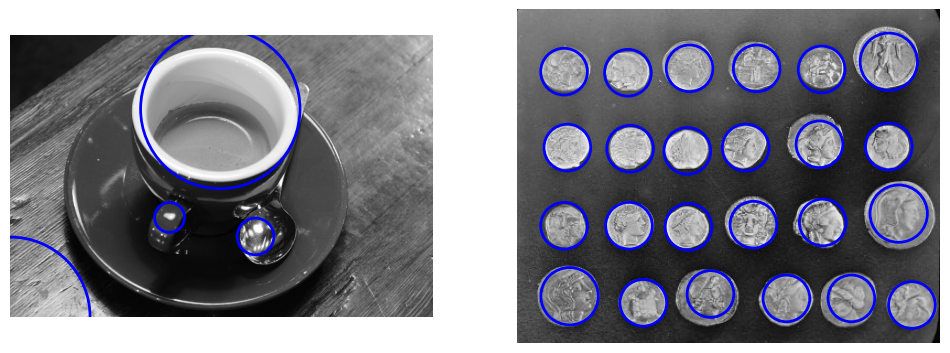

In [ ]:
# Use skimage.feature.blob_log to detect blobs in original gray images
# using a minimum sigma of 15 and a maximum sigma of 80 and 20 sigmas total
# thresholding is performed at 0.15
# Note: skimage.feature.blob_log returns the coordinates (y, x, sigma) of the blob
from matplotlib.patches import Circle

fig = plt.figure(figsize=(12, 24))
for i, image_gray in enumerate(images_gray):
    img = image_gray.astype(np.float32)
    if img.max() > 1.5:
        img = img / 255.0

    blobs_gray = skimage.feature.blob_log(
        img,
        min_sigma=15,
        max_sigma=80,
        num_sigma=20,
        threshold=0.15
    )

    # Compute radii of blobs: r = sqrt(2) * sigma
    blobs_radii = np.sqrt(2) * blobs_gray[:, 2] if blobs_gray.size else np.array([])

    ax = fig.add_subplot(1, 2, i + 1)
    ax.imshow(img, cmap='gray')
    # Draw circles
    for (y, x, s), r in zip(blobs_gray, blobs_radii):
        circ = Circle((x, y), r, linewidth=2, fill=False, edgecolor='b')
        ax.add_patch(circ)
    config_plot()

plt.show()


Multiscale representation with Gaussian pyramid

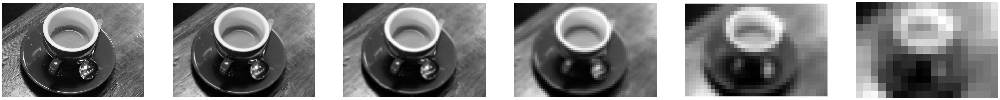

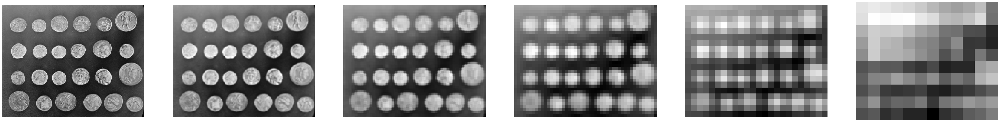

In [ ]:
gaussian_pyramids = []

# Create a 6 level Gaussian pyramid for each gray image using sigma of 1
# with subsampling factor of 2 and store each pyramid into gaussian_pyramids above to be used for the next code block
for image_gray in images_gray:
    img = image_gray.astype(np.float32)
    if img.max() > 1.5:
        img = img / 255.0

    gaussian_pyramid = []
    # Use skimage's pyramid_gaussian: max_layer=5 gives 6 levels (0..5)
    for level, g in enumerate(skimage.transform.pyramid_gaussian(
    img, sigma=1, downscale=2, channel_axis=None, max_layer=5, preserve_range=True
)):
        gaussian_pyramid.append(g.astype(np.float32))

    gaussian_pyramids.append(gaussian_pyramid)

    # Visualize Gaussian pyramid
    fig = plt.figure(figsize=(72, 18))
    for idx, gaussian_pyramid_image in enumerate(gaussian_pyramid):
        ax = fig.add_subplot(1, 6, idx + 1)
        ax.imshow(gaussian_pyramid_image, cmap='gray')
        config_plot()

Laplacian pyramid

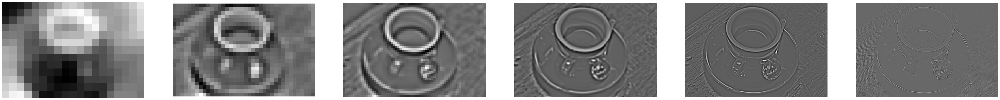

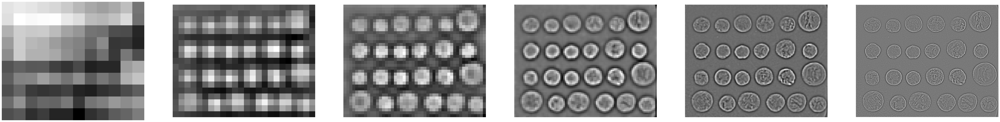

In [ ]:
laplacian_pyramids = []

# Create a 6 level Laplacian pyramid for each gray image using their Gaussian pyramids
# Store each pyramid into laplacian_pyramids above to be used for the next code block
for gaussian_pyramid in gaussian_pyramids:
    laplacian_pyramid = []
    n_levels = len(gaussian_pyramid)

    for i in range(n_levels - 1):
        current = gaussian_pyramid[i].astype(np.float32)
        next_coarse = gaussian_pyramid[i + 1].astype(np.float32)
        # Upsample coarse to current resolution
        up = skimage.transform.resize(
            next_coarse,
            output_shape=current.shape,
            mode='reflect',
            anti_aliasing=True,
            preserve_range=True,
            order=1
        ).astype(np.float32)
        lap = current - up
        laplacian_pyramid.append(lap)

    # Last level: keep the coarsest Gaussian image
    laplacian_pyramid.append(gaussian_pyramid[-1].astype(np.float32))

    # Visualize Laplacian pyramid
    fig = plt.figure(figsize=(72, 18))
    for idx, laplacian_pyramid_image in enumerate(reversed(laplacian_pyramid)):
        ax = fig.add_subplot(1, 6, idx + 1)
        ax.imshow(laplacian_pyramid_image, cmap='gray')
        config_plot()

    laplacian_pyramids.append(laplacian_pyramid)



Image reconstruction with Laplacian Pyramid

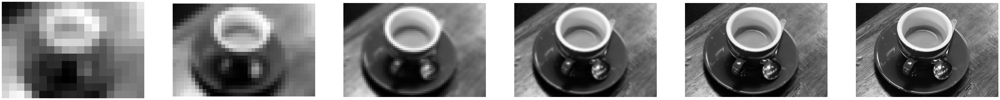

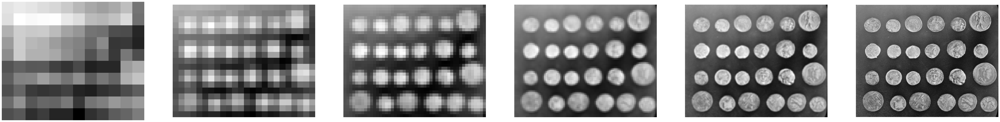

In [ ]:
# Reconstruct each 'compressed' image in Laplacian pyramid
reconstructed_pyramids = []

for laplacian_pyramid in laplacian_pyramids:

    # Initialize the image reconstruction pyramid
    # Start from the coarsest level (last element)
    current = laplacian_pyramid[-1].astype(np.float32)
    if current.max() > 1.5:
        current = current / 255.0
    image_pyramid = [None] * len(laplacian_pyramid)
    image_pyramid[-1] = np.clip(current, 0.0, 1.0)

    # Go from coarse to fine
    for lvl in range(len(laplacian_pyramid) - 2, -1, -1):
        target_shape = laplacian_pyramid[lvl].shape
        up = skimage.transform.resize(
            image_pyramid[lvl + 1],
            output_shape=target_shape,
            mode='reflect',
            anti_aliasing=True,
            preserve_range=True,
            order=1
        ).astype(np.float32)
        current = up + laplacian_pyramid[lvl].astype(np.float32)
        current = np.clip(current, 0.0, 1.0)
        image_pyramid[lvl] = current

    # Visualize reconstructed image pyramid
    fig = plt.figure(figsize=(72, 18))
    for idx, image in enumerate(reversed(image_pyramid)):
        ax = fig.add_subplot(1, 6, idx + 1)
        ax.imshow(image, cmap='gray')
        config_plot()

    reconstructed_pyramids.append(image_pyramid)

